# Integrantes
* Tomas Acosta Bernal
* Samuel Romero

In [1]:
import cv2
import matplotlib.pyplot as plt
import pandas 
import numpy
import os

# Exploracion datos

In [2]:
ruta = "data/Imagenes/"
elementos = os.listdir(ruta)
for _ in elementos:
    print(f"Número de elementos en la carpeta {_}:", len(os.listdir(ruta + _)))

Número de elementos en la carpeta test: 372
Número de elementos en la carpeta train: 1178
Número de elementos en la carpeta val: 107


In [4]:
1178//4


294

In [5]:
294*3

882

Número óptimo de clusters según el método del codo: 11


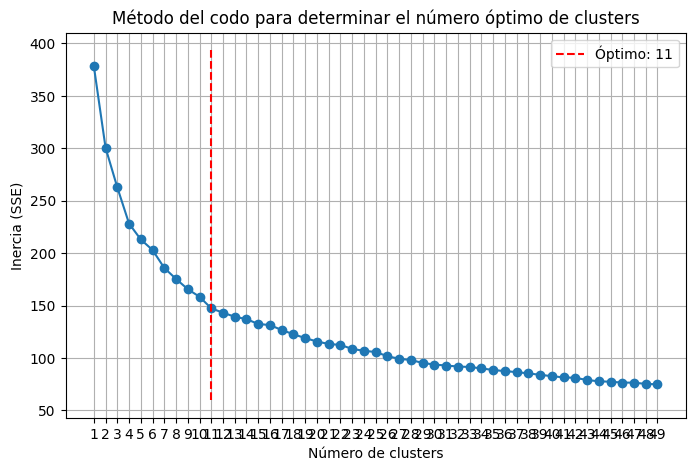

In [6]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from kneed import KneeLocator  # Instalar con: pip install kneed

# Directorio de imágenes y cálculo de histogramas (igual que antes)
ruta_train = "data/Imagenes/train/"
train_data = os.listdir(ruta_train)

histograms = []
nombres = []

for img_name in train_data:
    img_path = os.path.join(ruta_train, img_name)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        continue
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    hist = cv2.normalize(hist, hist).flatten()  
    histograms.append(hist)
    nombres.append(img_name)

histograms = np.array(histograms)

# Rango de clusters a probar, por ejemplo de 1 a 10
range_clusters = range(1, 50)
inercia = []

for k in range_clusters:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(histograms)
    inercia.append(kmeans.inertia_)

# Utilizar KneeLocator para detectar el "codo"
kneedle = KneeLocator(range_clusters, inercia, curve='convex', direction='decreasing')
optimal_k = kneedle.knee
print("Número óptimo de clusters según el método del codo:", optimal_k)

# Graficar el método del codo
plt.figure(figsize=(8,5))
plt.plot(range_clusters, inercia, marker='o')
plt.xlabel("Número de clusters")
plt.ylabel("Inercia (SSE)")
plt.title("Método del codo para determinar el número óptimo de clusters")
plt.xticks(range_clusters)
plt.grid(True)
plt.vlines(optimal_k, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', colors='red', label=f'Óptimo: {optimal_k}')
plt.legend()
plt.show()


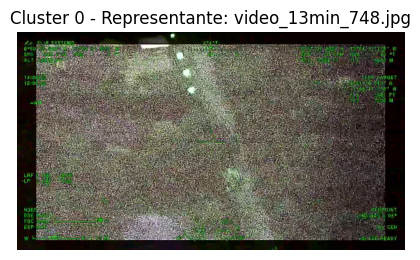

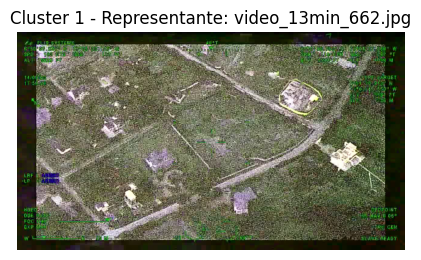

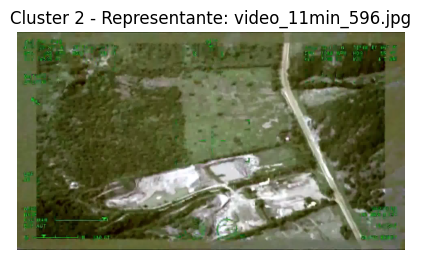

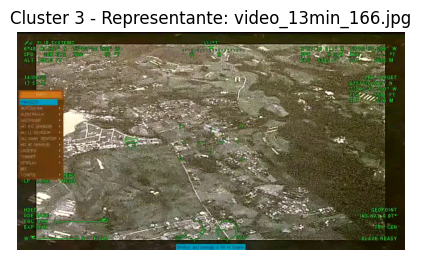

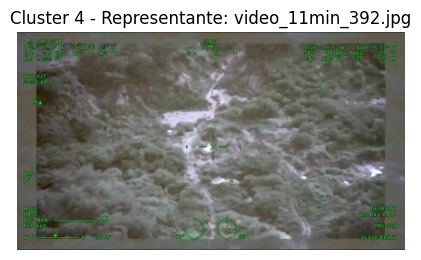

...

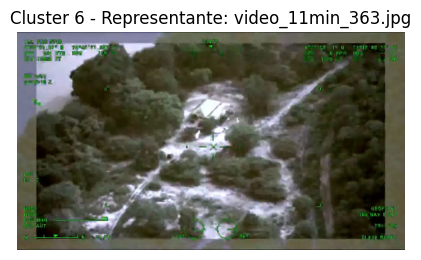

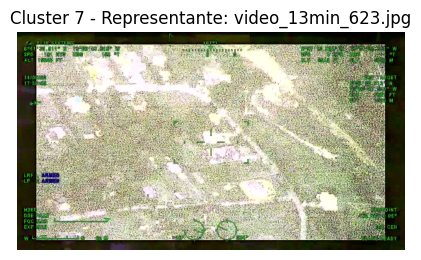

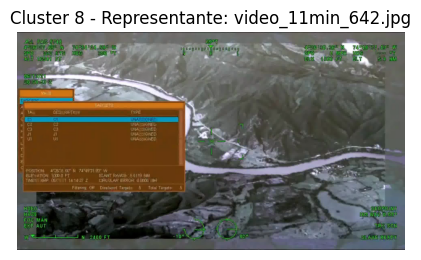

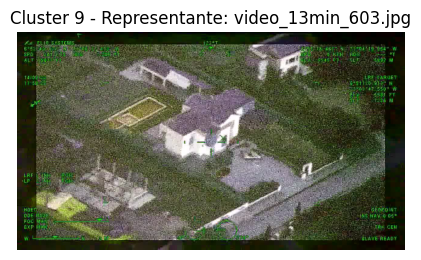

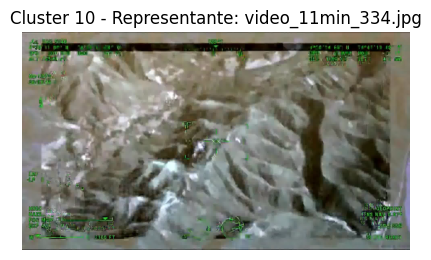

In [7]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Directorio de imágenes
ruta_train = "data/Imagenes/train/"
train_data = os.listdir(ruta_train)

histograms = []
nombres = []

for img_name in train_data:
    img_path = os.path.join(ruta_train, img_name)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        continue
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    hist = cv2.normalize(hist, hist).flatten()  
    histograms.append(hist)
    nombres.append(img_name)

histograms = np.array(histograms)

num_clusters = 11
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(histograms)

for cluster in range(num_clusters):
    indices = np.where(clusters == cluster)[0]
    if len(indices) == 0:
        continue
    
    cluster_histograms = histograms[indices]
    cluster_names = [nombres[i] for i in indices]
    
    centroid = kmeans.cluster_centers_[cluster]
    
    distances = [cv2.compareHist(hist, centroid, cv2.HISTCMP_BHATTACHARYYA) for hist in cluster_histograms]
    indice_min = np.argmin(distances)
    
    imagen_repr = cluster_names[indice_min]
    
    img_path = os.path.join(ruta_train, imagen_repr)
    img = cv2.imread(img_path)
    plt.figure(figsize=(5,5))
    plt.imshow(img)
    plt.title(f"Cluster {cluster} - Representante: {imagen_repr}")
    plt.axis("off")
    plt.show()


Segun el numero optimo de clusters podemos ver que las imagenes difieren bastante entre ellas, primero calculamos el histograma normalizado y se eligieron 11 grupos distintos que agrupaban las imagenes en esos clusters.

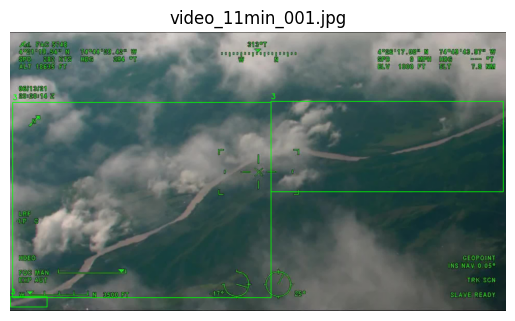

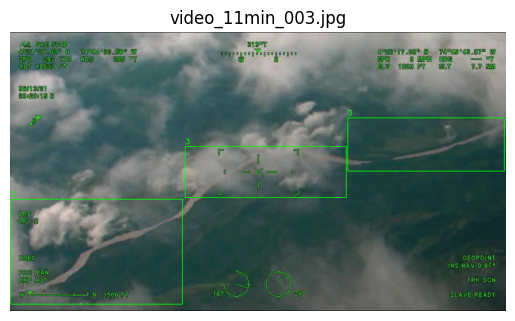

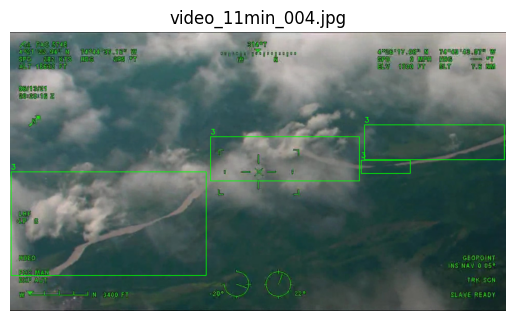

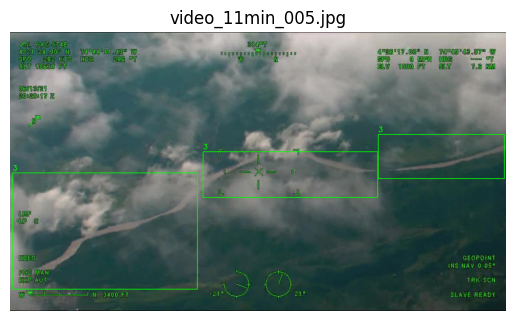

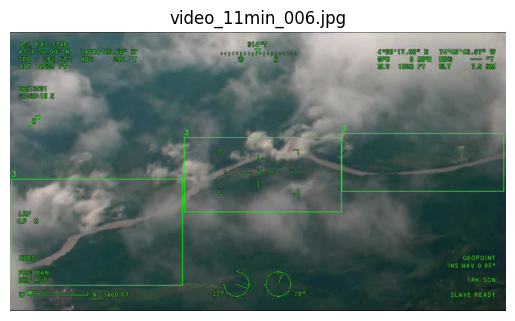

...

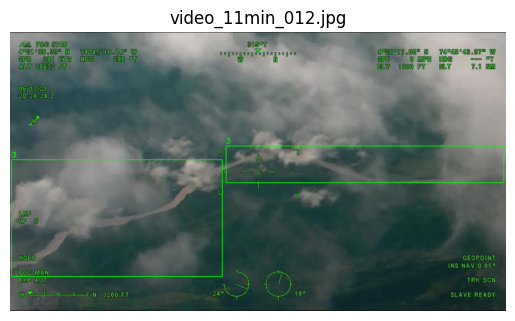

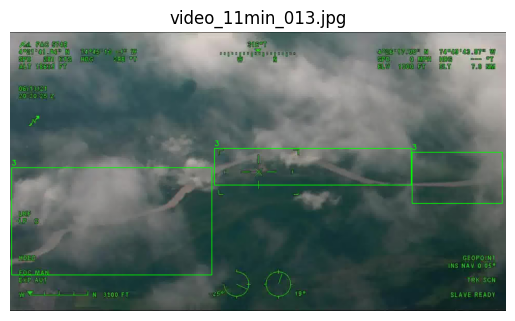

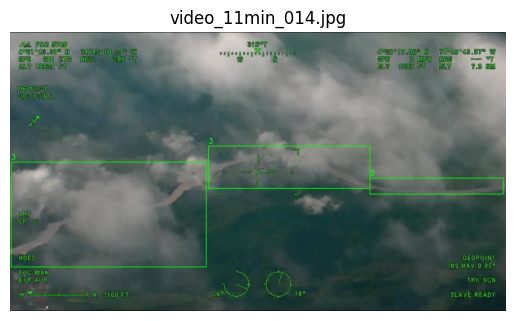

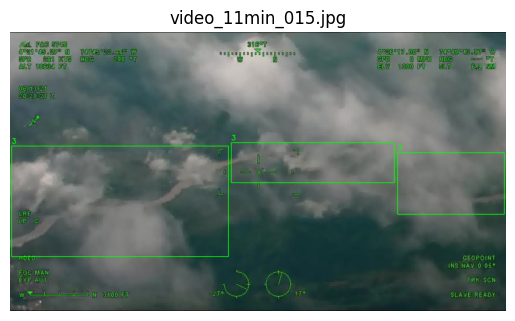

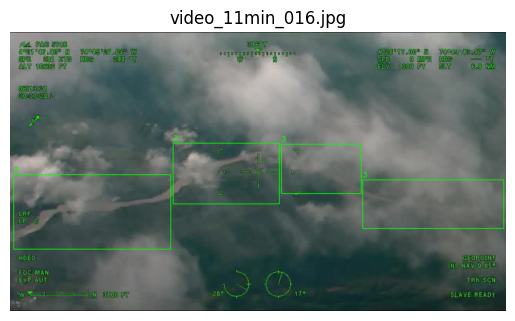

In [3]:
import os
import cv2
import matplotlib.pyplot as plt

# Directorios de imágenes y etiquetas
image_dir = "data/Imagenes/train"
label_dir = "data/Etiquetas/train"

image_files = [f for f in os.listdir(image_dir) if f.lower().endswith('.jpg')]

for image_file in image_files[:15]:
    img_path = os.path.join(image_dir, image_file)
    img = cv2.imread(img_path)
    if img is None:
        print("No se pudo leer:", img_path)
        continue

    height, width, _ = img.shape

    base_name, _ = os.path.splitext(image_file)
    label_path = os.path.join(label_dir, base_name + ".txt")
    if not os.path.exists(label_path):
        print("No existe etiqueta para:", image_file)
        continue

    with open(label_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        parts = line.strip().split()
        if len(parts) != 5:
            print("Formato de etiqueta incorrecto en", label_path)
            continue

        class_id, x_center_norm, y_center_norm, width_norm, height_norm = map(float, parts)
        
        x_center = x_center_norm * width
        y_center = y_center_norm * height
        box_width = width_norm * width
        box_height = height_norm * height

        x1 = int(x_center - box_width / 2)
        y1 = int(y_center - box_height / 2)
        x2 = int(x_center + box_width / 2)
        y2 = int(y_center + box_height / 2)

        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        
        cv2.putText(img, str(int(class_id)), (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title(image_file)
    plt.axis("off")
    plt.show()


Hay algunas imagenes muy malas, que tienen una etiqueta que a simple vista no se ve ninguna zona de mineria ilegal

# Exploracion de datos

Revisemos primero cuantos tienen anotaciones y cuantos no tienen

Distribución de imágenes por conjunto:
       count
train   1178
valid    107
test     372


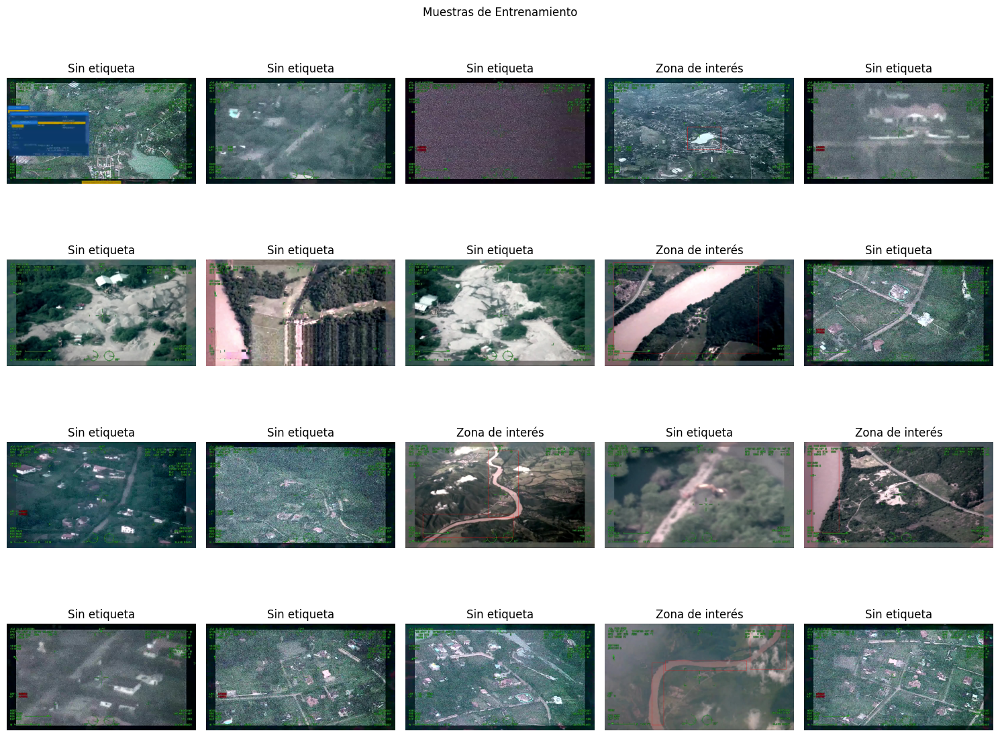

In [3]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import random

# Ruta raíz de los datos
DATA_ROOT = Path('data')
if not DATA_ROOT.exists():
    raise FileNotFoundError(f"Ruta de datos no encontrada: {DATA_ROOT}")

# Rutas según tu estructura de carpetas
img_root = DATA_ROOT / 'Imagenes'
lbl_root = DATA_ROOT / 'Etiquetas'

# Solo una clase
class_names = ["Zona de interés"]

# 1. Conteo de imágenes por conjunto
counts = {}
splits = {'train': 'train', 'valid': 'val', 'test': 'test'}

for key, folder in splits.items():
    path = img_root / folder
    counts[key] = len(list(path.glob('*.*'))) if path.exists() else 0

# Mostrar distribución
dist = pd.Series(counts, name='count')
print("Distribución de imágenes por conjunto:")
print(dist.to_frame())

# 2. Visualización de muestras con bounding boxes
train_img = img_root / 'train'
train_lbl = lbl_root / 'train'

population = list(train_img.glob('*.*'))
if not population:
    raise FileNotFoundError(f"No se encontraron imágenes en {train_img}")

# Tomar hasta 20 muestras aleatorias
k = min(20, len(population))
sample_images = random.sample(population, k)

n_cols = 5
n_rows = (k + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))

for ax, img_path in zip(axes.flatten(), sample_images):
    img = Image.open(img_path).convert("RGB")
    draw = ImageDraw.Draw(img)
    w, h = img.size

    lbl_path = train_lbl / f"{img_path.stem}.txt"
    title_labels = set()
    if lbl_path.exists():
        for line in lbl_path.read_text().splitlines():
            parts = line.strip().split()
            if len(parts) < 5:
                continue  # línea incompleta
            cls, x_c, y_c, bw, bh = map(float, parts[:5])

            if int(cls) != 3:
                continue  # ignorar clases distintas

            # Forzar clase única
            cls = 0

            # Calcular coordenadas del bounding box
            cx, cy = x_c * w, y_c * h
            bw_pix, bh_pix = bw * w, bh * h
            x1, y1 = cx - bw_pix / 2, cy - bh_pix / 2
            x2, y2 = cx + bw_pix / 2, cy + bh_pix / 2

            # Dibujar bbox
            draw.rectangle([x1, y1, x2, y2], outline='red', width=2)
            title_labels.add(class_names[int(cls)])

    ax.imshow(img)
    ax.set_title(", ".join(sorted(title_labels)) or "Sin etiqueta")
    ax.axis('off')

# Ocultar ejes sobrantes si hay menos de 20 imágenes
for ax in axes.flatten()[k:]:
    ax.axis('off')

plt.suptitle('Muestras de Entrenamiento')
plt.tight_layout()
plt.show()


### Verificamos las clases que hay

In [7]:
from pathlib import Path
from collections import defaultdict

# Rutas a las carpetas de etiquetas
label_dirs = [
    Path("data/Etiquetas/train"),
    Path("data/Etiquetas/val"),
    Path("data/Etiquetas/test")
]

# Contadores
conteo_clases = defaultdict(int)
imagenes_por_clase = defaultdict(list)

for label_dir in label_dirs:
    if not label_dir.exists():
        print(f"⚠️ Carpeta no encontrada: {label_dir}")
        continue

    for txt_path in label_dir.glob("*.txt"):
        lines = txt_path.read_text().splitlines()

        if not lines:
            # Clase especial -1 para imágenes sin anotaciones (background puro)
            conteo_clases[-1] += 1
            imagenes_por_clase[-1].append(txt_path.stem)
            continue

        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5 and parts[0].isdigit():
                class_id = int(parts[0])
                conteo_clases[class_id] += 1
                imagenes_por_clase[class_id].append(txt_path.stem)

# Mostrar resultados
print("\n📊 Conteo de clases en el dataset:")
for class_id, count in sorted(conteo_clases.items()):
    ejemplos = ", ".join(imagenes_por_clase[class_id][:3])
    if class_id == -1:
        print(f"Clase {class_id} (solo fondo): {count} imágenes sin anotaciones (Ejemplos: {ejemplos}...)")
    else:
        print(f"Clase {class_id}: {count} objetos (Ejemplos: {ejemplos}...)")



📊 Conteo de clases en el dataset:
Clase -1 (solo fondo): 295 imágenes sin anotaciones (Ejemplos: video_11min_002, video_11min_024, video_11min_025...)
Clase 0: 44 objetos (Ejemplos: video_11min_465, video_11min_466, video_11min_467...)
Clase 1: 2305 objetos (Ejemplos: video_11min_094, video_11min_096, video_11min_097...)
Clase 2: 1013 objetos (Ejemplos: video_11min_089, video_11min_089, video_11min_090...)
Clase 3: 642 objetos (Ejemplos: video_11min_001, video_11min_001, video_11min_001...)
Clase 4: 129 objetos (Ejemplos: video_11min_098, video_11min_099, video_11min_100...)



🔍 Clase Solo fondo: mostrando hasta 5 imágenes


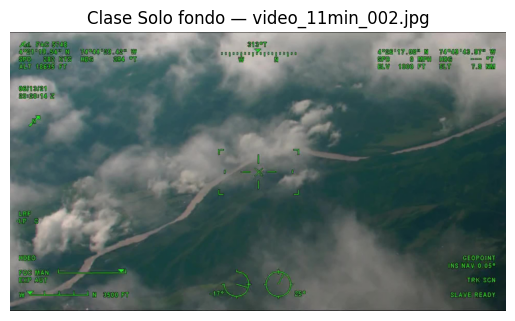

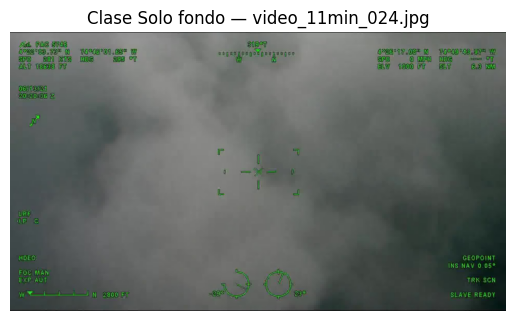

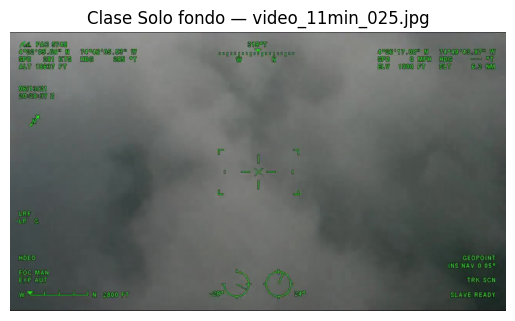

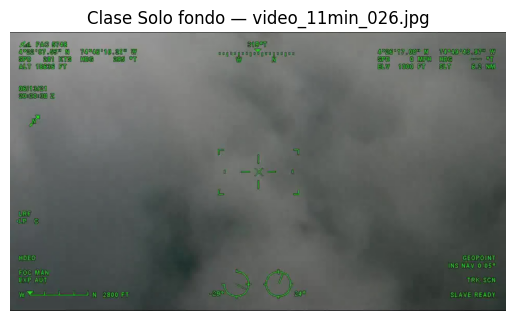

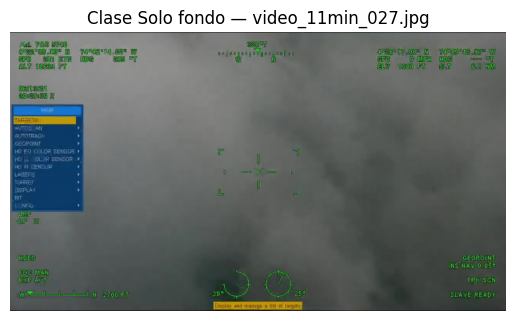


🔍 Clase 0: mostrando hasta 5 imágenes


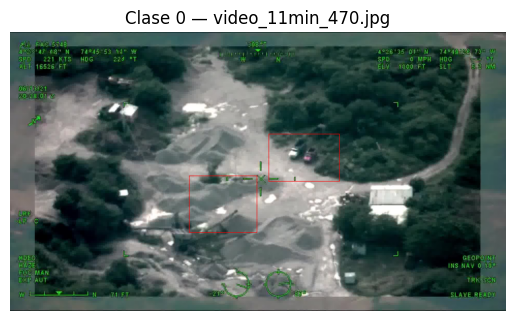

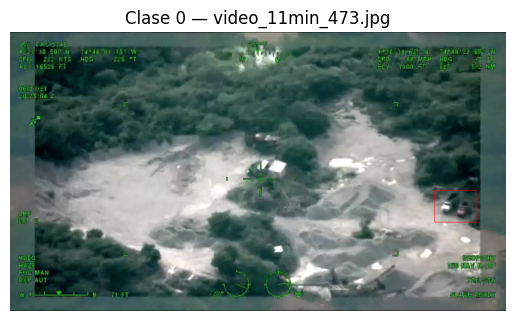

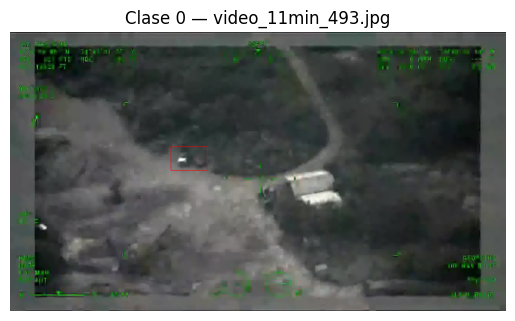

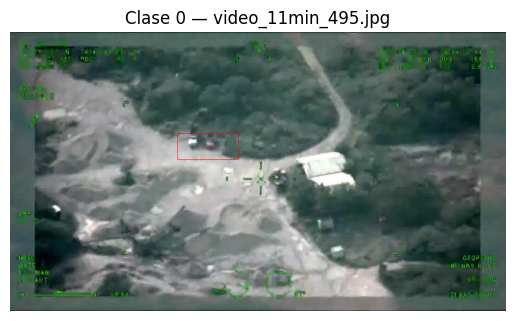

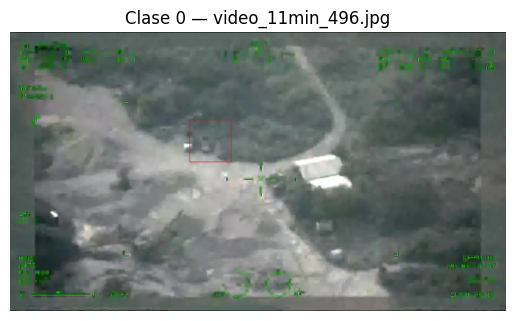


🔍 Clase 1: mostrando hasta 5 imágenes


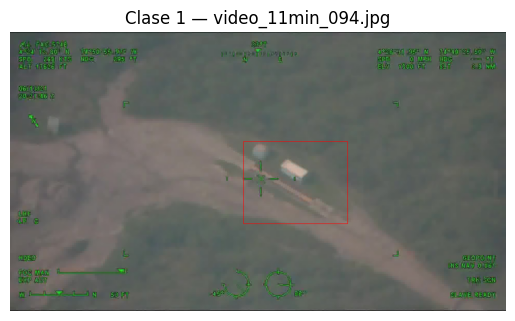

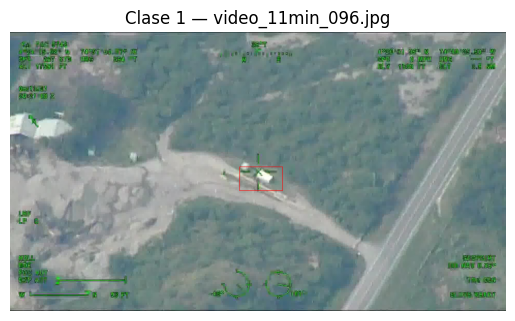

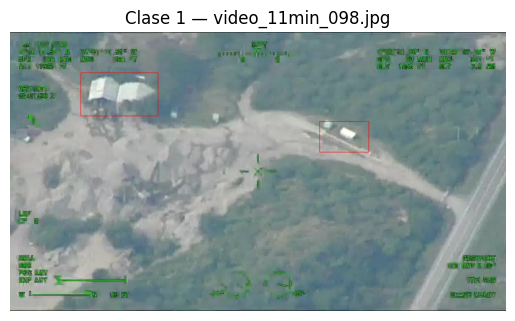

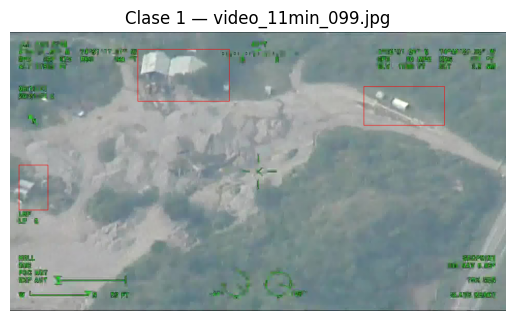

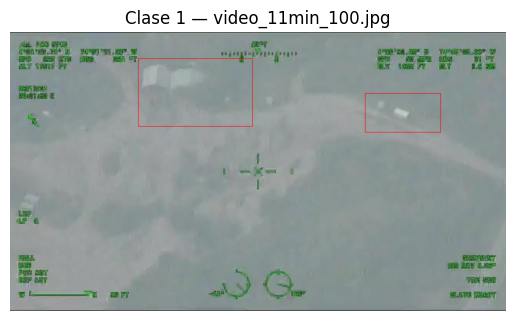


🔍 Clase 2: mostrando hasta 5 imágenes


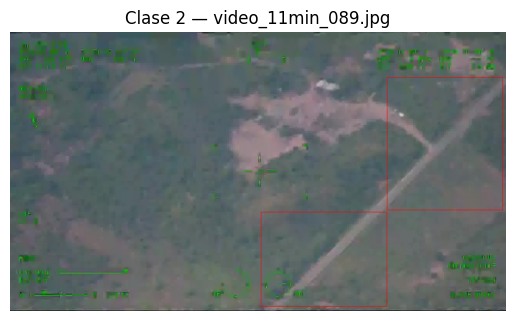

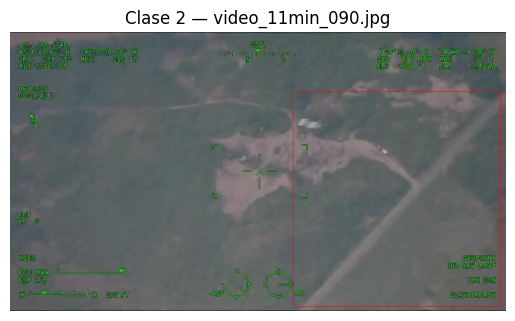

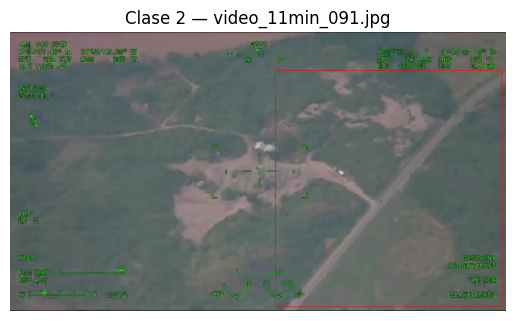

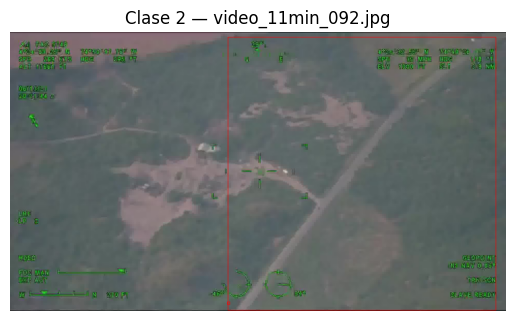

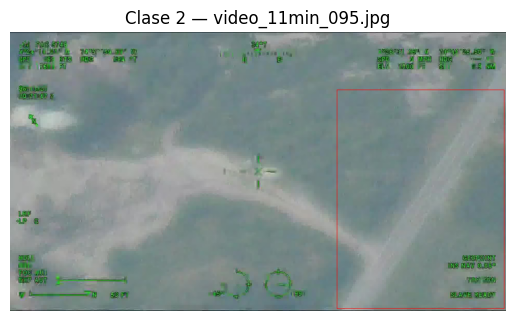


🔍 Clase 3: mostrando hasta 5 imágenes


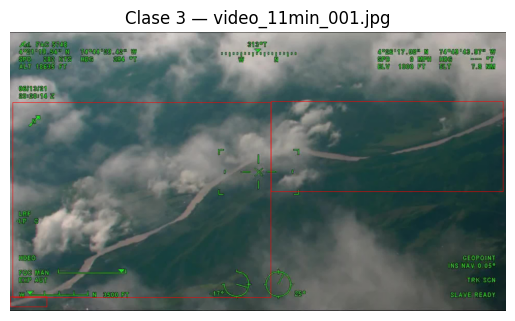

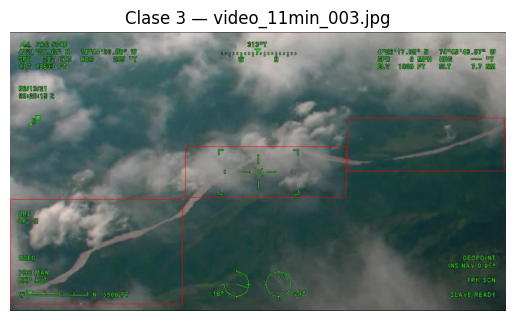

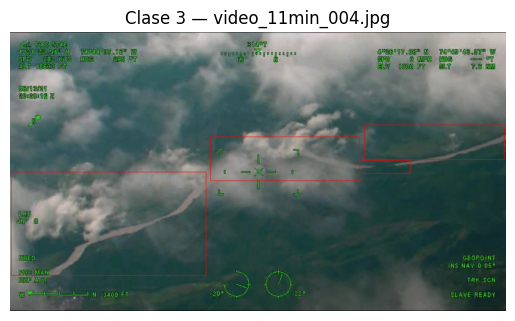

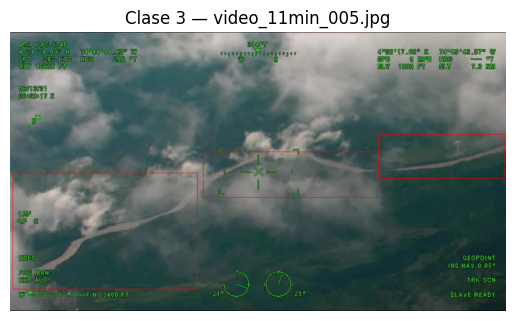

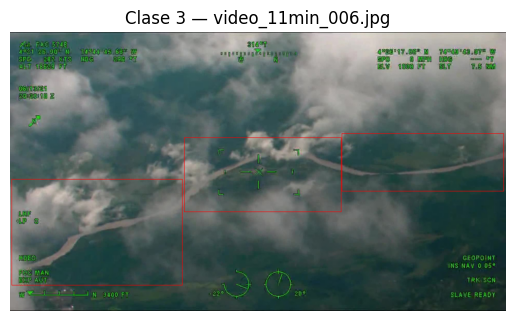


🔍 Clase 4: mostrando hasta 5 imágenes


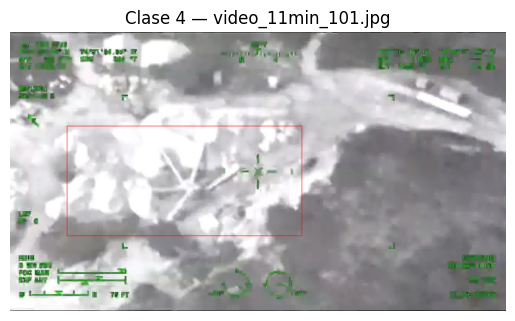

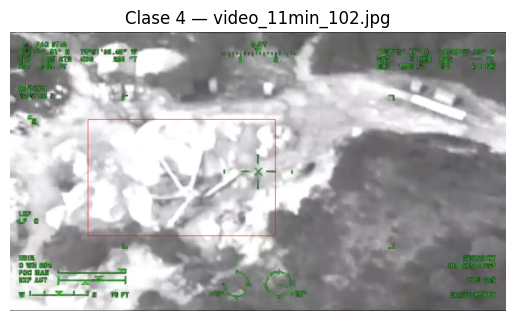

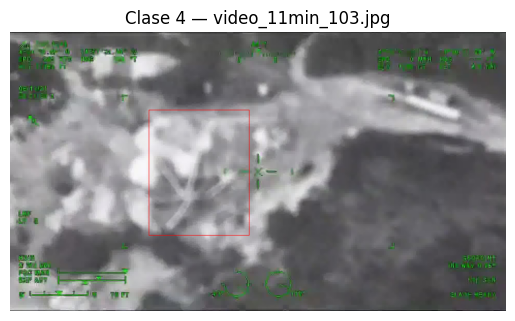

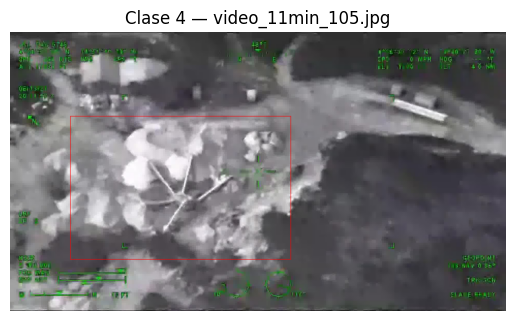

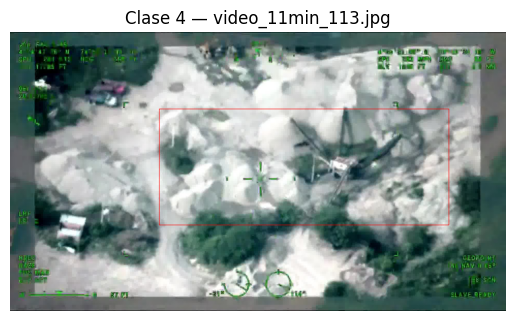

In [9]:
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from pathlib import Path
from collections import defaultdict

# Configura las rutas
data_root = Path("data")
img_dirs = {
    'train': data_root / "Imagenes/train",
    'val': data_root / "Imagenes/val",
    'test': data_root / "Imagenes/test"
}
label_dirs = {
    'train': data_root / "Etiquetas/train",
    'val': data_root / "Etiquetas/validation",
    'test': data_root / "Etiquetas/test"
}

# Recolectar imágenes por clase
imagenes_por_clase = defaultdict(list)

for split in ['train', 'val', 'test']:
    img_dir = img_dirs[split]
    lbl_dir = label_dirs[split]
    if not img_dir.exists() or not lbl_dir.exists():
        continue

    for lbl_path in lbl_dir.glob("*.txt"):
        lines = lbl_path.read_text().splitlines()
        imagen_path = img_dir / f"{lbl_path.stem}.jpg"
        if not imagen_path.exists():
            imagen_path = img_dir / f"{lbl_path.stem}.png"
        if not imagen_path.exists():
            continue

        if not lines:
            # Etiqueta vacía → fondo puro → clase -1
            if len(imagenes_por_clase[-1]) < 5:
                imagenes_por_clase[-1].append((imagen_path, lbl_path))
            continue

        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5 and parts[0].isdigit():
                class_id = int(parts[0])
                if len(imagenes_por_clase[class_id]) < 5:
                    imagenes_por_clase[class_id].append((imagen_path, lbl_path))
                break  # Solo una vez por clase en ese archivo

# Mostrar hasta 5 imágenes por clase
for class_id, ejemplos in sorted(imagenes_por_clase.items()):
    print(f"\n🔍 Clase {class_id if class_id != -1 else 'Solo fondo'}: mostrando hasta 5 imágenes")
    for img_path, lbl_path in ejemplos:
        img = Image.open(img_path).convert("RGB")
        draw = ImageDraw.Draw(img)
        w, h = img.size

        if class_id != -1:
            for line in lbl_path.read_text().splitlines():
                parts = line.strip().split()
                if len(parts) >= 5 and int(parts[0]) == class_id:
                    _, x_c, y_c, bw, bh = map(float, parts)
                    cx, cy = x_c * w, y_c * h
                    bw_pix, bh_pix = bw * w, bh * h
                    x1, y1 = cx - bw_pix / 2, cy - bh_pix / 2
                    x2, y2 = cx + bw_pix / 2, cy + bh_pix / 2
                    draw.rectangle([x1, y1, x2, y2], outline="red", width=2)

        plt.imshow(img)
        plt.title(f"Clase {class_id if class_id != -1 else 'Solo fondo'} — {img_path.name}")
        plt.axis('off')
        plt.show()


### Etiquetas validas

In [10]:
from pathlib import Path

def contar_etiquetas_validas(img_dir: Path, lbl_dir: Path):
    con_etiqueta = 0
    sin_etiqueta = 0
    clase_background = []  # Lista de imágenes sin etiquetas válidas

    for img_path in img_dir.glob('*.*'):
        if img_path.suffix.lower() not in [".jpg", ".jpeg", ".png"]:
            continue  # Ignorar archivos que no sean imagen

        lbl_path = lbl_dir / f"{img_path.stem}.txt"
        if lbl_path.exists():
            contenido = lbl_path.read_text().strip()
            if contenido:
                con_etiqueta += 1
            else:
                sin_etiqueta += 1
                clase_background.append(img_path.name)
        else:
            sin_etiqueta += 1
            clase_background.append(img_path.name)

    return con_etiqueta, sin_etiqueta, clase_background

# Directorios raíz
img_root = Path("data/Imagenes")
lbl_root = Path("data/Etiquetas")

# Diccionario con las rutas por conjunto
splits = {
    'train': ('train', 'train'),
    'val': ('val', 'val'),  
    'test': ('test', 'test')
}

print("\n📊 Resumen de etiquetas por conjunto:")

for split_name, (img_sub, lbl_sub) in splits.items():
    img_dir = img_root / img_sub
    lbl_dir = lbl_root / lbl_sub

    if not img_dir.exists():
        print(f"[{split_name}] ⚠️ Carpeta de imágenes no encontrada: {img_dir}")
        continue

    if not lbl_dir.exists():
        print(f"[{split_name}] ⚠️ Carpeta de etiquetas no encontrada: {lbl_dir}")
        continue

    con_etiqueta, sin_etiqueta, fondo = contar_etiquetas_validas(img_dir, lbl_dir)
    total = con_etiqueta + sin_etiqueta
    print(f"[{split_name.upper()}] Total: {total:4} | Con etiqueta: {con_etiqueta:4} | Solo fondo (-1): {sin_etiqueta:4}")
    
    if fondo:
        ejemplos = ", ".join(fondo[:3])
        print(f"             Ejemplos sin objetos: {ejemplos}...")



📊 Resumen de etiquetas por conjunto:
[TRAIN] Total: 1178 | Con etiqueta:  948 | Solo fondo (-1):  230
             Ejemplos sin objetos: video_11min_002.jpg, video_11min_024.jpg, video_11min_025.jpg...
[VAL] Total:  107 | Con etiqueta:   91 | Solo fondo (-1):   16
             Ejemplos sin objetos: video_11min_645.jpg, video_11min_650.jpg, video_11min_657.jpg...
[TEST] Total:  372 | Con etiqueta:  325 | Solo fondo (-1):   47
             Ejemplos sin objetos: video_11min_500.jpg, video_11min_501.jpg, video_11min_502.jpg...


No sabemos que hacer con esas anotaciones que no son validas. Yo pensaria en revisarlas y clasificarlas manualmente. Haydemar nos dijo que no las tenemos en cuenta.

# Conclusiones sobre la exploracion

Primero vamos a definir las clases:
* Clase -1: Background
* Clase 0 : Vehiculos
* Clase 1: Bodegas
* Clase 2: Caminos
* Clase 3: Rios
* Clase 4: Zonas de mineria ilegal

Con base en esto y sabiendo que:


📊 Conteo de clases en el dataset:
* Clase -1: 295 objetos
* Clase 0: 44 objetos (Ejemplos: video_11min_465, video_11min_466, video_11min_467...)
* Clase 1: 2305 objetos (Ejemplos: video_11min_094, video_11min_096, video_11min_097...)
* Clase 2: 1013 objetos (Ejemplos: video_11min_089, video_11min_089, video_11min_090...)
* Clase 3: 642 objetos (Ejemplos: video_11min_001, video_11min_001, video_11min_001...)
* Clase 4: 129 objetos (Ejemplos: video_11min_098, video_11min_099, video_11min_100...)


Debemos Realizar aumentacion de datos para las clases, -1,0,2,3,4 para dejarlos lo mejor balanceadas frente a la clase dominante de la clase 1. Por lo tanto, primero vamos a realizar aumentacion de datos y vamos a verificar cuantos datos mas o menos tendriamos por cada clase.



# Pasos para la solucion planteada de balance de clases

# 🧠 Plan de Acción para Data Augmentation con Albumentations (YOLO)

## 🎯 Objetivo

Balancear el dataset de detección de objetos incrementando las instancias de clases minoritarias usando **Data Augmentation**, con enfoque específico en detección usando **YOLOv5/YOLOv8**.

### Clases actuales:

| Clase | Nombre                  | Original | Meta   | Aumentar |
|-------|-------------------------|----------|--------|----------|
| 0     | Vehículos               | 44       | 1800   | 1756     |
| 1     | Bodegas (dominante)     | 2305     | 3000   | 695      |
| 2     | Caminos                 | 1013     | 3000   | 1987     |
| 3     | Ríos                    | 642      | 2500   | ~1858    |
| 4     | Zonas de minería ilegal | 129      | 2000   | ~1871    |
| 4     | Background| 129      | 2000   | ~1871    |

---

## Plan Paso a Paso

### Paso 1: Análisis por Clase

- Recorrer todos los `.txt` del conjunto de entrenamiento.
- Identificar qué imágenes contienen instancias de cada clase.
- Crear una lista de imágenes por clase para aplicar augmentación dirigida.

---

### Paso 2: Definir Meta por Clase

Determinar cuántas instancias nuevas deben generarse para alcanzar los objetivos de balance.

---

### Paso 3: Definir Pipeline de Transformación

Usar la librería **Albumentations**, diseñada para detección de objetos

---
## Paso 4: Aplicar Augmentación por Clase
* Cargar cada imagen y su `.txt`.
* Aplicar el transformador definido.
* Guardar:
  * Imagen aumentada: `aug_video_11min_001_01.jpg`
  * Etiqueta transformada: `aug_video_11min_001_01.txt`

---
## Paso 5: Organización de Archivos
Guardar las imágenes y etiquetas aumentadas en carpetas dedicadas:

```
data/
├── Imagenes/
│   └── train/
│       └── augmented/
└── Etiquetas/
    └── train/
        └── augmented/
```

O dejarlas dentro de `train/` con prefijo `aug_` para distinguirlas.


---

## Paso 6: Verificación
* Recontar objetos por clase después del aumento.
* Visualizar muestras con bounding boxes dibujados.


### Aumentacion de datos creada

In [ ]:
import albumentations as A
import cv2
from pathlib import Path
from tqdm import tqdm
import pandas as pd
import random
from sklearn.model_selection import train_test_split
import os

# Configuración general
DATA_ROOT = Path("data")
IMG_DIR = DATA_ROOT / "Imagenes"
LBL_DIR = DATA_ROOT / "Etiquetas"
OUTPUT_DIR = Path("data_augmented")

# Define el pipeline de augmentación de forma escalable
def get_augmentation_pipeline():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.4),
        A.MotionBlur(blur_limit=3, p=0.2),
        A.RandomGamma(p=0.2),
        A.Affine(scale=(0.9, 1.1), translate_percent=0.1, rotate=(-10, 10), p=0.5),
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

# Cargar todas las imágenes con anotaciones válidas directamente en memoria (DataFrame extendido)
def cargar_dataset_en_memoria():
    registros = []
    for split in ["train", "val", "test"]:
        img_split = IMG_DIR / split
        lbl_split = LBL_DIR / split
        if not img_split.exists() or not lbl_split.exists():
            continue

        for img_path in img_split.glob("*.jpg"):
            lbl_path = lbl_split / f"{img_path.stem}.txt"

            image = cv2.imread(str(img_path))
            if image is None:
                continue

            if not lbl_path.exists():
                # Imagen sin archivo de etiquetas → clase -1
                registros.append({
                    "img_stem": img_path.stem,
                    "split": split,
                    "image": image,
                    "labels": [],
                    "path": str(img_path)
                })
                continue

            lines = lbl_path.read_text().strip().splitlines()
            valid_lines = [l for l in lines if len(l.strip().split()) >= 5]

            registros.append({
                "img_stem": img_path.stem,
                "split": split,
                "image": image,
                "labels": valid_lines,
                "path": str(img_path)
            })
    return pd.DataFrame(registros)


# Aplicar augmentación sobre un dataframe en memoria y devolver los nuevos registros

def augment_dataframe_in_memory(df, target_class: int, target_total_objs: int):
    transform = get_augmentation_pipeline()
    df_clase = df[df["labels"].apply(lambda ls: any(int(l.split()[0]) == target_class for l in ls))]

    total_actual_objs = df["labels"].apply(lambda ls: sum(1 for l in ls if int(l.split()[0]) == target_class)).sum()
    if total_actual_objs >= target_total_objs:
        print(f"✅ Clase {target_class} ya tiene {total_actual_objs} objetos, no se requiere augmentación.")
        return df

    print(f"🔄 Aumentando clase {target_class}: {total_actual_objs} objetos -> {target_total_objs}")

    registros_aug = []
    objetos_agregados = 0
    index = 0

    while total_actual_objs + objetos_agregados < target_total_objs:
        row = df_clase.iloc[index % len(df_clase)]  # ciclo circular
        image = row['image']
        h, w = image.shape[:2]
        bboxes = []
        class_labels = []
        for line in row['labels']:
            parts = line.split()
            if len(parts) >= 5 and int(parts[0]) == target_class:
                x, y, bw, bh = map(float, parts[1:5])
                bboxes.append([x, y, bw, bh])
                class_labels.append(target_class)

        augmented = transform(image=image, bboxes=bboxes, class_labels=class_labels)
        aug_img = augmented['image']
        aug_bboxes = augmented['bboxes']

        if not aug_bboxes:
            index += 1
            continue

        new_labels = [f"{target_class} {x:.6f} {y:.6f} {bw:.6f} {bh:.6f}" for x, y, bw, bh in aug_bboxes]
        objetos_agregados += len(new_labels)

        registros_aug.append({
            "img_stem": f"aug_class{target_class}_{row['img_stem']}_{index}_{random.randint(1000,9999)}",
            "split": row['split'],
            "image": aug_img,
            "labels": new_labels,
            "path": None
        })

        index += 1

    print(f"✅ Clase {target_class}: {objetos_agregados} nuevos objetos generados en memoria.")
    return pd.concat([df, pd.DataFrame(registros_aug)], ignore_index=True)

# Guardar el dataset final en carpetas organizadas

def guardar_dataframe(df_final):
    for split in ["train", "val", "test"]:
        img_out = OUTPUT_DIR / "imagenes" / split
        lbl_out = OUTPUT_DIR / "etiquetas" / split
        img_out.mkdir(parents=True, exist_ok=True)
        lbl_out.mkdir(parents=True, exist_ok=True)

    for _, row in tqdm(df_final.iterrows(), total=len(df_final)):
        split = row['split']
        stem = row['img_stem']
        img_path = OUTPUT_DIR / "imagenes" / split / f"{stem}.jpg"
        lbl_path = OUTPUT_DIR / "etiquetas" / split / f"{stem}.txt"

        cv2.imwrite(str(img_path), row['image'])
        with open(lbl_path, 'w') as f:
            f.write("\n".join(row['labels']))

# Pipeline completo

def generar_dataset_con_augmentacion(objetivos_por_clase):
    df = cargar_dataset_en_memoria()
    for clase, meta in objetivos_por_clase.items():
        df = augment_dataframe_in_memory(df, clase, meta)

    df_shuffled = df.sample(frac=1, random_state=42).reset_index(drop=True)
    df_train, df_test = train_test_split(df_shuffled, test_size=0.2, random_state=42)
    df_train, df_val = train_test_split(df_train, test_size=0.1, random_state=42)  # 10% del 80% = 8%

    df_train['split'] = 'train'
    df_val['split'] = 'val'
    df_test['split'] = 'test'

    df_final = pd.concat([df_train, df_val, df_test], ignore_index=True)
    guardar_dataframe(df_final)
    print("✅ Dataset completo guardado en memoria y exportado a 'data_augmented'.")


In [11]:


# Diccionario de metas por clase
objetivos_por_clase = {
    0: 2000,   # Vehículos
    1: 3000,   # Bodegas
    2: 3000,   # Caminos
    3: 2800,   # Ríos
    4: 2500    # Zonas de minería ilegal
}
generar_dataset_con_augmentacion(objetivos_por_clase)



🔄 Aumentando clase 0: 44 objetos -> 2000
✅ Clase 0: 1956 nuevos objetos generados en memoria.
🔄 Aumentando clase 1: 2294 objetos -> 3000
✅ Clase 1: 707 nuevos objetos generados en memoria.
🔄 Aumentando clase 2: 1010 objetos -> 3000
✅ Clase 2: 1990 nuevos objetos generados en memoria.
🔄 Aumentando clase 3: 642 objetos -> 2800
✅ Clase 3: 2158 nuevos objetos generados en memoria.
🔄 Aumentando clase 4: 129 objetos -> 2500
✅ Clase 4: 2371 nuevos objetos generados en memoria.


100%|██████████| 8292/8292 [03:13<00:00, 42.81it/s]


✅ Dataset completo guardado en memoria y exportado a 'data_augmented'.


```python
Generando 59 aumentos por imagen...

  0%|          | 0/31 [00:00<?, ?it/s]
  3%|3         | 1/31 [00:00<00:22,  1.34it/s]
  6%|6         | 2/31 [00:01<00:21,  1.32it/s]
 10%|9         | 3/31 [00:02<00:20,  1.34it/s]
 13%|#2        | 4/31 [00:03<00:20,  1.31it/s]
 16%|#6        | 5/31 [00:03<00:19,  1.30it/s]
 19%|#9        | 6/31 [00:04<00:18,  1.32it/s]
 23%|##2       | 7/31 [00:05<00:18,  1.31it/s]
 26%|##5       | 8/31 [00:06<00:17,  1.33it/s]
 29%|##9       | 9/31 [00:06<00:16,  1.34it/s]
 32%|###2      | 10/31 [00:07<00:15,  1.35it/s]
 35%|###5      | 11/31 [00:08<00:15,  1.32it/s]
 39%|###8      | 12/31 [00:09<00:14,  1.34it/s]
 42%|####1     | 13/31 [00:09<00:13,  1.38it/s]
 45%|####5     | 14/31 [00:10<00:12,  1.31it/s]
 48%|####8     | 15/31 [00:11<00:11,  1.35it/s]
 52%|#####1    | 16/31 [00:12<00:11,  1.32it/s]
 55%|#####4    | 17/31 [00:12<00:10,  1.31it/s]
 58%|#####8    | 18/31 [00:13<00:09,  1.36it/s]
 61%|######1   | 19/31 [00:14<00:08,  1.36it/s]
 65%|######4   | 20/31 [00:15<00:08,  1.33it/s]
 68%|######7   | 21/31 [00:15<00:07,  1.34it/s]
 71%|#######   | 22/31 [00:16<00:06,  1.35it/s]
 74%|#######4  | 23/31 [00:17<00:05,  1.34it/s]
 77%|#######7  | 24/31 [00:18<00:05,  1.33it/s]
 81%|########  | 25/31 [00:18<00:04,  1.30it/s]
 84%|########3 | 26/31 [00:19<00:03,  1.29it/s]
 87%|########7 | 27/31 [00:20<00:03,  1.28it/s]
 90%|######### | 28/31 [00:21<00:02,  1.29it/s]
 94%|#########3| 29/31 [00:21<00:01,  1.30it/s]
 97%|#########6| 30/31 [00:22<00:00,  1.31it/s]
100%|##########| 31/31 [00:23<00:00,  1.32it/s]
100%|##########| 31/31 [00:23<00:00,  1.32it/s]
```

Verificamos la creacion de la aumentacion

In [12]:

# Rutas a las carpetas de etiquetas
label_dirs = [
    Path("data_augmented/etiquetas/train"),
    Path("data_augmented/etiquetas/val"),
    Path("data_augmented/etiquetas/test")
]

# Contadores
conteo_clases = defaultdict(int)
imagenes_por_clase = defaultdict(list)

for label_dir in label_dirs:
    if not label_dir.exists():
        print(f"⚠️ Carpeta no encontrada: {label_dir}")
        continue

    for txt_path in label_dir.glob("*.txt"):
        for line in txt_path.read_text().splitlines():
            parts = line.strip().split()
            if len(parts) >= 5 and parts[0].isdigit():
                class_id = int(parts[0])
                conteo_clases[class_id] += 1
                imagenes_por_clase[class_id].append(txt_path.stem)

# Mostrar resultados
print("\n📊 Conteo de clases en el dataset:")
for class_id, count in sorted(conteo_clases.items()):
    ejemplos = ", ".join(imagenes_por_clase[class_id][:3])
    print(f"Clase {class_id}: {count} objetos (Ejemplos: {ejemplos}...)")
    



📊 Conteo de clases en el dataset:
Clase 0: 1995 objetos (Ejemplos: aug_class0_video_11min_465_0_7578, aug_class0_video_11min_465_1075_9721, aug_class0_video_11min_465_1118_9069...)
Clase 1: 2992 objetos (Ejemplos: aug_class1_video_11min_094_0_8388, aug_class1_video_11min_098_3_3449, aug_class1_video_11min_098_3_3449...)
Clase 2: 2970 objetos (Ejemplos: aug_class2_video_11min_089_0_4384, aug_class2_video_11min_089_0_4384, aug_class2_video_11min_089_619_5945...)
Clase 3: 2742 objetos (Ejemplos: aug_class3_video_11min_001_0_8235, aug_class3_video_11min_001_0_8235, aug_class3_video_11min_001_0_8235...)
Clase 4: 2488 objetos (Ejemplos: aug_class4_video_11min_098_1210_3049, aug_class4_video_11min_098_1331_5821, aug_class4_video_11min_098_1452_2226...)


Verificar duplicados

In [15]:
import hashlib

def hash_imagen(path):
    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        return None
    resized = cv2.resize(img, (64, 64))  # Reduce dimensiones
    hash_val = hashlib.sha256(resized.tobytes()).hexdigest()
    return hash_val

def encontrar_duplicados_por_hash(img_dir: Path):
    hash_map = {}
    duplicados = []

    for img_path in img_dir.glob("*.jpg"):
        h = hash_imagen(img_path)
        if h in hash_map:
            duplicados.append((img_path.name, hash_map[h].name))
        else:
            hash_map[h] = img_path

    return duplicados


In [18]:

def eliminar_duplicados_y_labels(duplicados, carpeta_img, carpeta_lbl):
    eliminados = 0
    for dup, original in duplicados:
        img_path = carpeta_img / dup
        lbl_path = carpeta_lbl / (Path(dup).stem + ".txt")
        if img_path.exists():
            img_path.unlink()
            eliminados += 1
        if lbl_path.exists():
            lbl_path.unlink()
    return eliminados

# Carpetas base
base_img_dir = Path("data_augmented/imagenes")
base_lbl_dir = Path("data_augmented/etiquetas")

for split in ["train", "val", "test"]:
    carpeta_img = base_img_dir / split
    carpeta_lbl = base_lbl_dir / split
    print(f"\n🔎 Verificando duplicados en: {carpeta_img}")

    duplicados = encontrar_duplicados_por_hash(carpeta_img)

    if duplicados:
        print(f" Se encontraron {len(duplicados)} duplicados en '{split}'. Eliminando...")
        eliminados = eliminar_duplicados_y_labels(duplicados, carpeta_img, carpeta_lbl)
        print(f" Se eliminaron {eliminados} pares de imagen + etiqueta.")
    else:
        print(f" No se encontraron duplicados exactos en '{split}'.")



🔎 Verificando duplicados en: data_augmented\imagenes\train
 Se encontraron 642 duplicados en 'train'. Eliminando...
 Se eliminaron 642 pares de imagen + etiqueta.

🔎 Verificando duplicados en: data_augmented\imagenes\val
 Se encontraron 18 duplicados en 'val'. Eliminando...
 Se eliminaron 18 pares de imagen + etiqueta.

🔎 Verificando duplicados en: data_augmented\imagenes\test
 Se encontraron 83 duplicados en 'test'. Eliminando...
 Se eliminaron 83 pares de imagen + etiqueta.


In [23]:
base_dir = Path("data_augmented/imagenes")
conteo = {}

total = 0
for split in ["train", "val", "test"]:
    carpeta = base_dir / split
    n = len(list(carpeta.glob("*.jpg")))
    conteo[split] = n
    total += n

print("\n Distribución final de imágenes tras limpieza de duplicados:")
for split, count in conteo.items():
    pct = 100 * count / total if total > 0 else 0
    print(f" - {split.capitalize():5}: {count} imágenes ({pct:.2f}%)")

print(f"\n Total de imágenes: {total}")


 Distribución final de imágenes tras limpieza de duplicados:
 - Train: 5259 imágenes (70.35%)
 - Val  : 644 imágenes (8.62%)
 - Test : 1572 imágenes (21.03%)

 Total de imágenes: 7475


In [24]:


etiquetas_dir = Path("data_augmented/etiquetas")
conteo_clases = defaultdict(int)

# Recorremos train, val y test
for split in ["train", "val", "test"]:
    carpeta = etiquetas_dir / split
    for lbl_file in carpeta.glob("*.txt"):
        for line in lbl_file.read_text().splitlines():
            parts = line.strip().split()
            if len(parts) >= 5 and parts[0].isdigit():
                clase = int(parts[0])
                conteo_clases[clase] += 1

# Total de objetos
total_objetos = sum(conteo_clases.values())

# Mostrar resultados
print("\n Porcentaje de objetos por clase en el dataset final:")
for clase in range(5):
    count = conteo_clases.get(clase, 0)
    pct = 100 * count / total_objetos if total_objetos > 0 else 0
    print(f" - Clase {clase}: {count} objetos ({pct:.2f}%)")

print(f"\n Total de objetos: {total_objetos}")



 Porcentaje de objetos por clase en el dataset final:
 - Clase 0: 1705 objetos (14.25%)
 - Clase 1: 2718 objetos (22.71%)
 - Clase 2: 2805 objetos (23.44%)
 - Clase 3: 2534 objetos (21.17%)
 - Clase 4: 2205 objetos (18.43%)

 Total de objetos: 11967


In [19]:

# Rutas a las carpetas de etiquetas
label_dirs = [
    Path("data_augmented/etiquetas/train"),
    Path("data_augmented/etiquetas/val"),
    Path("data_augmented/etiquetas/test")
]

# Contadores
conteo_clases = defaultdict(int)
imagenes_por_clase = defaultdict(list)

for label_dir in label_dirs:
    if not label_dir.exists():
        print(f"⚠️ Carpeta no encontrada: {label_dir}")
        continue

    for txt_path in label_dir.glob("*.txt"):
        for line in txt_path.read_text().splitlines():
            parts = line.strip().split()
            if len(parts) >= 5 and parts[0].isdigit():
                class_id = int(parts[0])
                conteo_clases[class_id] += 1
                imagenes_por_clase[class_id].append(txt_path.stem)

# Mostrar resultados
print("\n📊 Conteo de clases en el dataset:")
for class_id, count in sorted(conteo_clases.items()):
    ejemplos = ", ".join(imagenes_por_clase[class_id][:3])
    print(f"Clase {class_id}: {count} objetos (Ejemplos: {ejemplos}...)")
    



📊 Conteo de clases en el dataset:
Clase 0: 1705 objetos (Ejemplos: aug_class0_video_11min_465_0_7578, aug_class0_video_11min_465_1075_9721, aug_class0_video_11min_465_1118_9069...)
Clase 1: 2718 objetos (Ejemplos: aug_class1_video_11min_094_0_8388, aug_class1_video_11min_098_3_3449, aug_class1_video_11min_098_3_3449...)
Clase 2: 2805 objetos (Ejemplos: aug_class2_video_11min_089_0_4384, aug_class2_video_11min_089_0_4384, aug_class2_video_11min_089_619_5945...)
Clase 3: 2534 objetos (Ejemplos: aug_class3_video_11min_001_0_8235, aug_class3_video_11min_001_0_8235, aug_class3_video_11min_001_0_8235...)
Clase 4: 2205 objetos (Ejemplos: aug_class4_video_11min_098_1331_5821, aug_class4_video_11min_098_1452_2226, aug_class4_video_11min_098_1573_2769...)


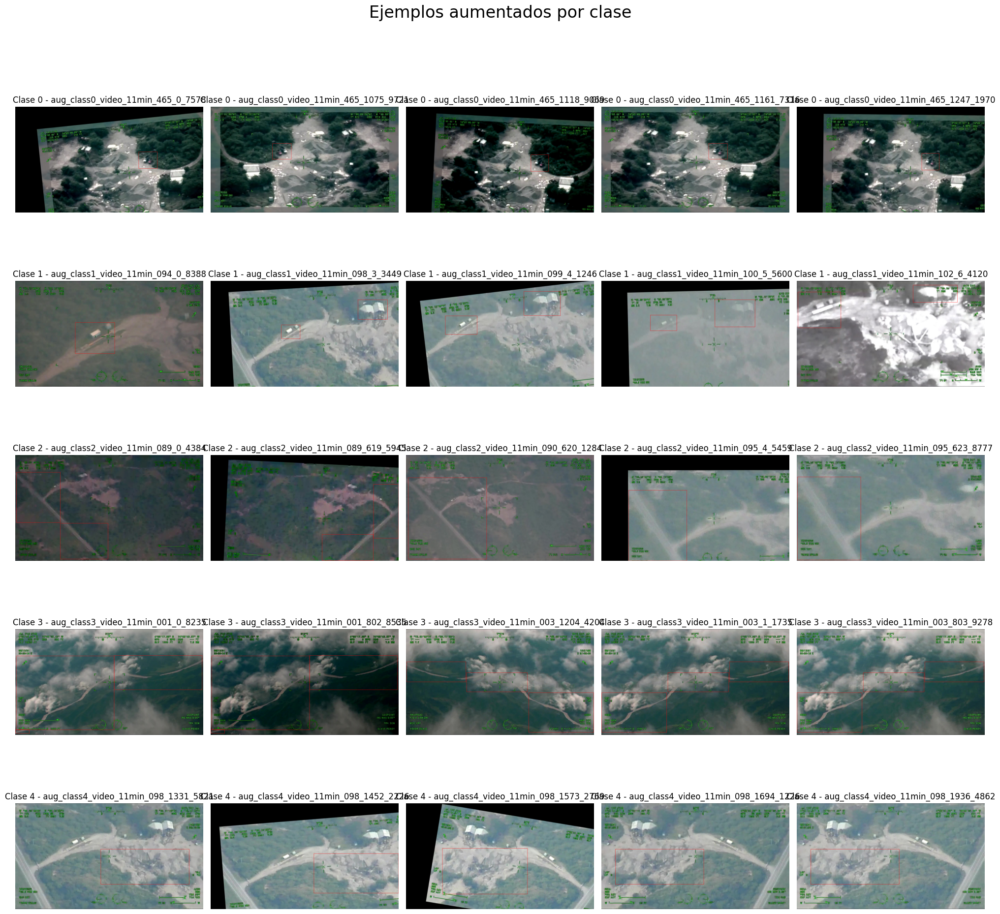

In [20]:
from pathlib import Path
from collections import defaultdict
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

# Configuración
AUG_IMG_DIR = Path("data_augmented/imagenes/train")
AUG_LBL_DIR = Path("data_augmented/etiquetas/train")
CLASES = [0, 1, 2, 3, 4]

# Recolectar hasta 5 imágenes por clase
imagenes_por_clase = defaultdict(list)

for txt_path in sorted(AUG_LBL_DIR.glob("*.txt")):
    if not txt_path.exists():
        continue
    lines = txt_path.read_text().splitlines()
    clases_en_archivo = {int(line.split()[0]) for line in lines if line.strip() and line[0].isdigit()}
    for cls_id in clases_en_archivo:
        if cls_id in CLASES and len(imagenes_por_clase[cls_id]) < 5:
            imagenes_por_clase[cls_id].append(txt_path.stem)

# Crear figura
fig, axes = plt.subplots(len(CLASES), 5, figsize=(20, 20))
fig.suptitle("Ejemplos aumentados por clase", fontsize=24)

for row, class_id in enumerate(CLASES):
    for col in range(5):
        ax = axes[row, col]
        if col >= len(imagenes_por_clase[class_id]):
            ax.axis('off')
            continue

        stem = imagenes_por_clase[class_id][col]
        img_path = AUG_IMG_DIR / f"{stem}.jpg"
        lbl_path = AUG_LBL_DIR / f"{stem}.txt"

        if not img_path.exists() or not lbl_path.exists():
            ax.axis('off')
            continue

        img = Image.open(img_path).convert("RGB")
        draw = ImageDraw.Draw(img)
        w, h = img.size

        for line in lbl_path.read_text().splitlines():
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            cls_id, x_c, y_c, bw, bh = map(float, parts[:5])
            if int(cls_id) != class_id:
                continue

            cx, cy = x_c * w, y_c * h
            bw_pix, bh_pix = bw * w, bh * h
            x1, y1 = cx - bw_pix / 2, cy - bh_pix / 2
            x2, y2 = cx + bw_pix / 2, cy + bh_pix / 2
            draw.rectangle([x1, y1, x2, y2], outline='red', width=2)

        ax.imshow(img)
        ax.set_title(f"Clase {class_id} - {stem}")
        ax.axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.93)



Una vez realizado esto para todas las categorias, ahora si podemos realizar la primera parte del modelo